In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
from __future__ import print_function

import os

import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from rasterio.plot import plotting_extent
import numpy as np
import pandas as pd
import time


try:
    import keras
    from imblearn.keras import balanced_batch_generator
    from imblearn.under_sampling import NearMiss
    import keras.backend as K
    from keras.models import Sequential
    from keras.models import model_from_json
    from keras.layers import Dense, Dropout, Activation
    from keras.optimizers import RMSprop
    from keras.optimizers import Adam
    from keras.optimizers import Adagrad
    from keras.optimizers import SGD
    from keras.callbacks import LambdaCallback, ReduceLROnPlateau, ModelCheckpoint
    from keras.layers.core import Lambda
    from keras.losses import categorical_crossentropy
    import tensorflow as tf
    from keras import regularizers

except:
    print("Keras not found")
    
np.random.seed(42)


def my_basename(path):
    return os.path.splitext(os.path.split(path)[1])[0]

file_dir=r'C:/Users/Mark.Rademaker/PycharmProjects/InternshipNaturalis/trait-geo-diverse-dl/concept proof'

Using TensorFlow backend.


#### Trial alternative dataset construction for faster execution

Create input dataset for entire globe

In [5]:
import gdal

##opening raster as 3d numpy array
inRas=gdal.Open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')
myarray=inRas.ReadAsArray()
print(myarray.shape)
print(type(myarray))


(41, 1800, 4320)
<class 'numpy.ndarray'>


In [ ]:
#get all col and row values for all cells on land 
df=pd.read_csv(file_dir+'/data/GIS/world_locations_to_predict.csv')
len_pd=np.arange(len(df))
print(len_pd)
lon=df["decimal_longitude"]
lat=df["decimal_latitude"]
lon=lon.values
lat=lat.values

row=[]
col=[]

src=rasterio.open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')

for i in len_pd:
    row_n, col_n = src.index(lon[i], lat[i])# spatial --> image coordinates
    row.append(row_n)
    col.append(col_n)


In [ ]:
#collect file with mean and std_dev for each band
mean_std=pd.read_csv(file_dir+'/data/GIS/env_bio_mean_std.txt',sep="\t")
mean_std=mean_std.to_numpy()


#################################
#extract the values for all bands and prepare input data
#################################
X=[]

for j in range(0,41):
    print(j)
    #start2=time.time()
    band=myarray[j]
    x=[]

    for i in range(0,len(row)):
        value= band[row[i],col[i]]
        if value <-1000:
            value=np.nan
            x.append(value)
        else:
            value = ((value - mean_std.item((j,1))) / mean_std.item((j,2)))#scale values
            x.append(value)
    #end2=time.time()
    #print(j,start2-end2)
    X.append(x)

#include row and column values
X.append(row)
X.append(col)
#set as numpy 2d array
X =np.array([np.array(xi) for xi in X])

df=pd.DataFrame(X)

df=df.T
df=df.dropna(axis=0, how='any')
input_X=df.loc[:,0:40]


row=df[41]
col=df[42]

#convert dataframe back to numpy array
input_X=input_X.values
#convert rows and col indices back to array
row=row.values
col=col.values

#save
prediction_array=np.save(file_dir+'/data/prediction_arrays/%s_prediction_array.npy'%spec,input_X)


Predict species specific model on input dataset

In [3]:
#access file with list of taxa names
taxa=pd.read_csv(file_dir+"/results/DNN_eval.txt",sep="\t")
taxa=taxa["Species"]

processing Rhinoceros_unicornis


(1800, 4320)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

C:\Users\Mark.Rademaker\PycharmProjects\InternshipNaturalis\venv\lib\site-packages\ipykernel_launcher.py:72: RuntimeWarning: invalid value encountered in greater
C:\Users\Mark.Rademaker\PycharmProjects\InternshipNaturalis\venv\lib\site-packages\ipykernel_launcher.py:72: RuntimeWarning: invalid value encountered in less
C:\Users\Mark.Rademaker\PycharmProjects\InternshipNaturalis\venv\lib\site-packages\ipykernel_launcher.py:73: RuntimeWarning: invalid value encountered in greater
C:\Users\Mark.Rademaker\PycharmProjects\InternshipNaturalis\venv\lib\site-packages\ipykernel_launcher.py:73: RuntimeWarning: invalid value encountered in less


Text(0.5, 1.0, 'Rhinoceros unicornis prediction map')

processing Rucervus_duvaucelii


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Rucervus duvaucelii prediction map')

processing Rupicapra_pyrenaica


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Rupicapra pyrenaica prediction map')

processing Rupicapra_rupicapra


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Rupicapra rupicapra prediction map')

processing Rusa_timorensis


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Rusa timorensis prediction map')

processing Rusa_unicolor


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Rusa unicolor prediction map')

processing Sus_barbatus


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Sus barbatus prediction map')

processing Sus_cebifrons


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Sus cebifrons prediction map')

processing Sus_philippensis


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Sus philippensis prediction map')

processing Sus_scrofa


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Sus scrofa prediction map')

processing Sylvicapra_grimmia


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Sylvicapra grimmia prediction map')

processing Syncerus_caffer


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Syncerus caffer prediction map')

processing Tapirus_bairdii


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tapirus bairdii prediction map')

processing Tapirus_pinchaque


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tapirus pinchaque prediction map')

processing Tapirus_terrestris


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tapirus terrestris prediction map')

processing Taurotragus_oryx


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Taurotragus oryx prediction map')

processing Tayassu_pecari


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tayassu pecari prediction map')

processing Tragelaphus_angasii


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus angasii prediction map')

processing Tragelaphus_buxtoni


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus buxtoni prediction map')

processing Tragelaphus_eurycerus


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus eurycerus prediction map')

processing Tragelaphus_imberbis


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

C:\Users\Mark.Rademaker\PycharmProjects\InternshipNaturalis\venv\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Text(0.5, 1.0, 'Tragelaphus imberbis prediction map')

processing Tragelaphus_scriptus


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus scriptus prediction map')

processing Tragelaphus_spekii


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus spekii prediction map')

processing Tragelaphus_strepsiceros


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragelaphus strepsiceros prediction map')

processing Tragulus_javanicus


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragulus javanicus prediction map')

processing Tragulus_kanchil


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragulus kanchil prediction map')

processing Tragulus_napu


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Tragulus napu prediction map')

processing Vicagna_vicugna


(1800, 4320)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 4320, 'height': 1800, 'count': 1, 'crs': CRS.from_dict(init='epsg:4326'), 'transform': Affine(0.08333333333333333, 0.0, -180.0,
       0.0, -0.08333333333333333, 90.0), 'tiled': False, 'interleave': 'band'}

Text(0.5, 1.0, 'Vicagna vicugna prediction map')

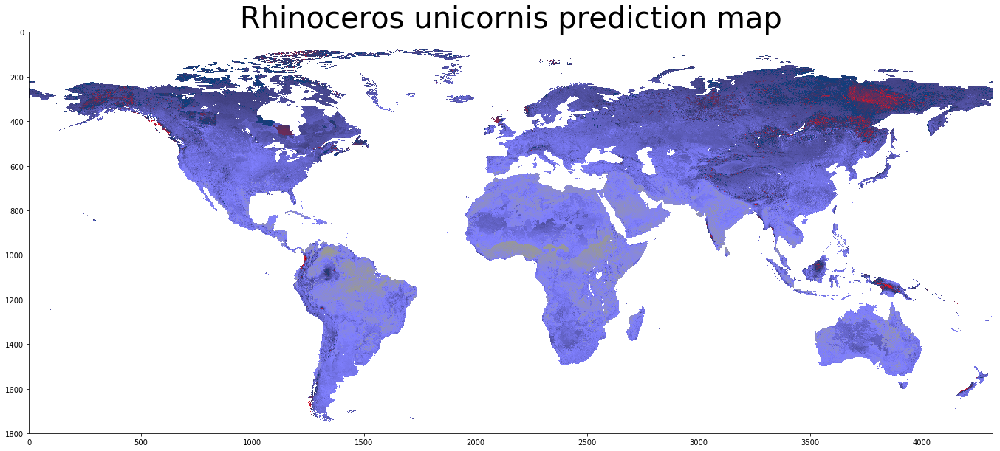

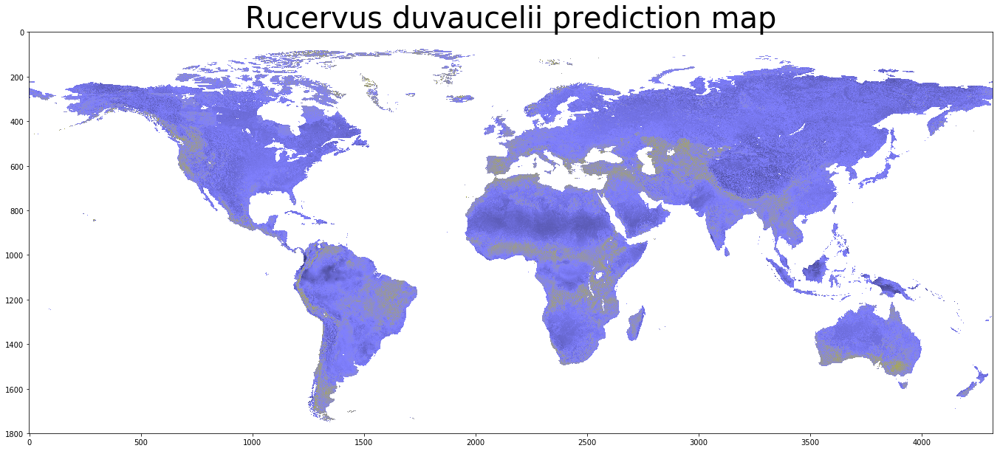

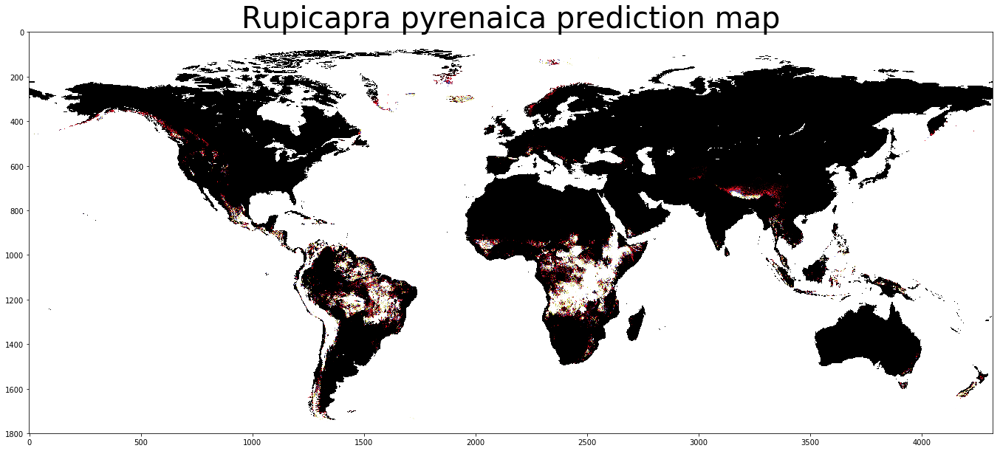

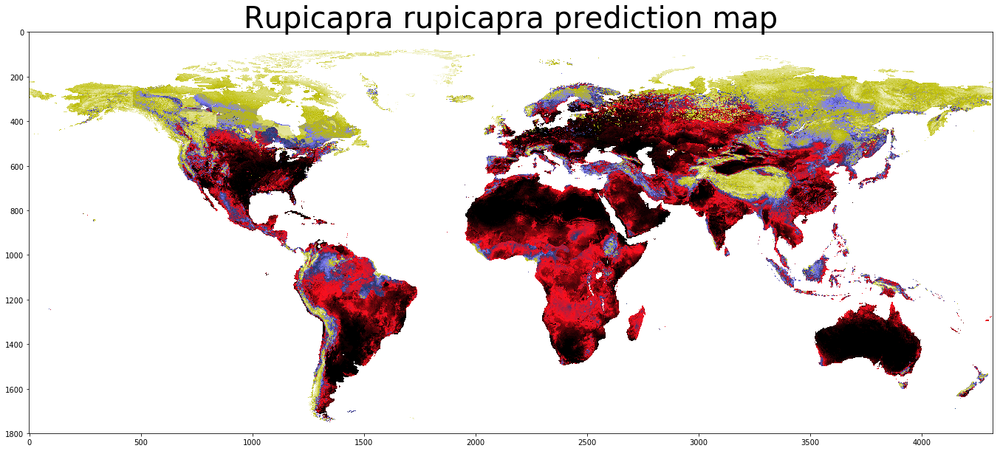

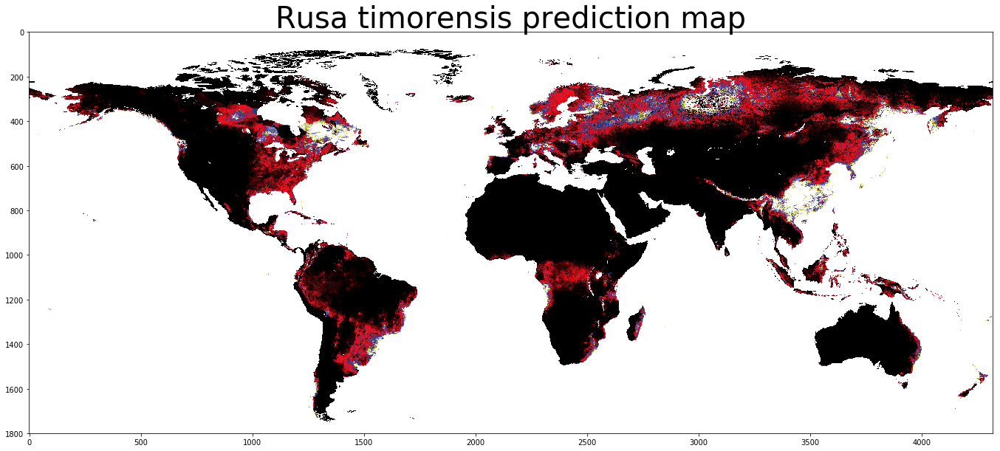

...

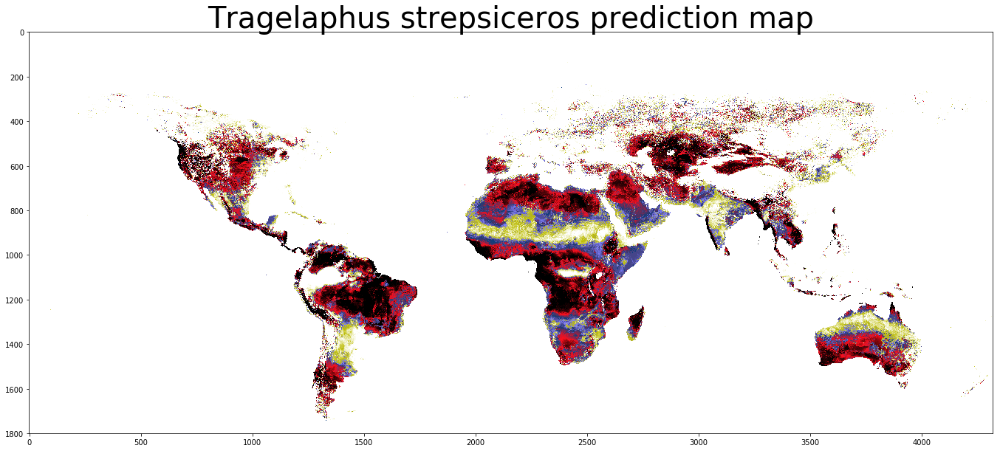

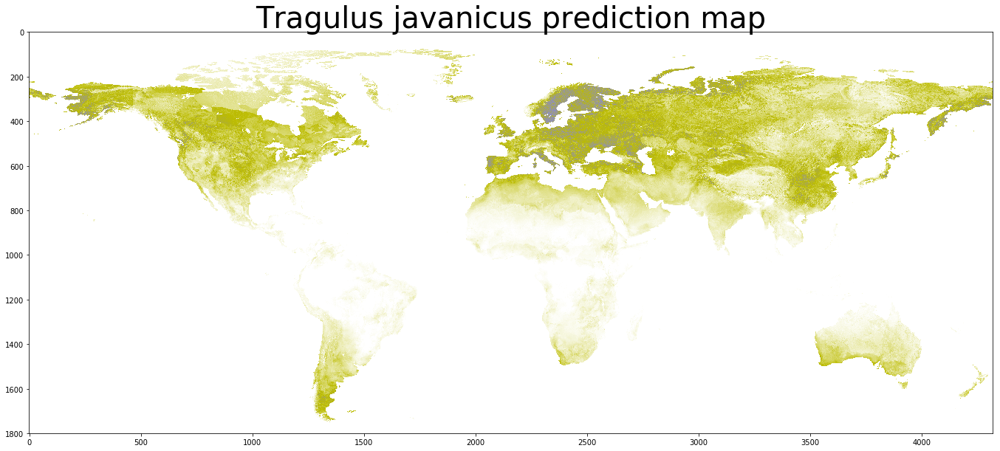

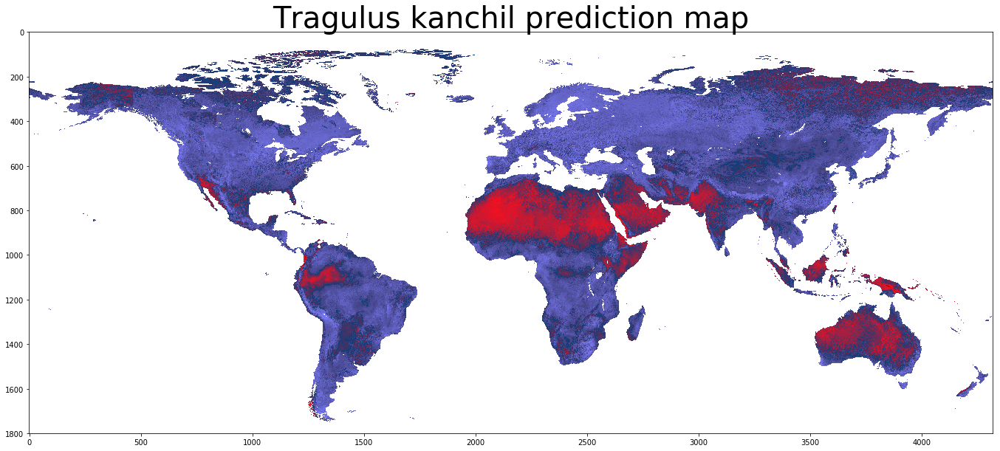

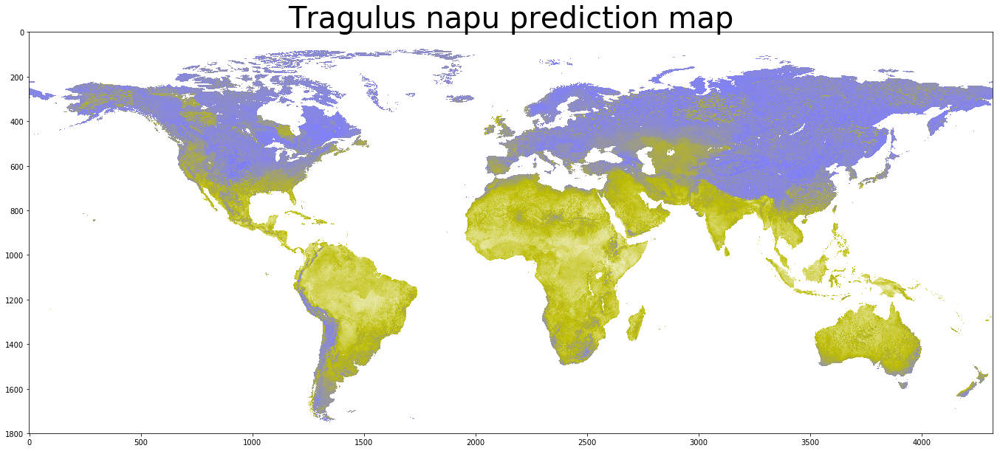

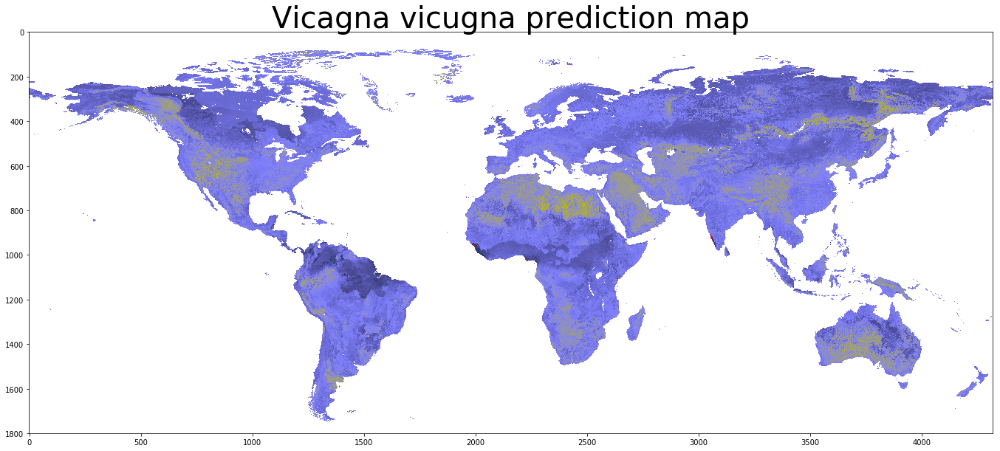

In [6]:
#import time
for species in taxa[127:]:
#start=time.time()
#set the species 
    spec=species
    print("processing", spec)
    spec=spec.replace(" ","_")

    ################################################################################################
    ################################################################################################
    #   run the predictions 
    ################################################################################################
    ################################################################################################

    input_X=np.load(file_dir+'/data/GIS/world_prediction_array.npy')#%spec)
    df=pd.DataFrame(input_X)

    #create copy of band to later subset values in
    new_band=myarray[1].copy()
    new_band.shape


    ### Load DNN model for the species and predict values:
    #load json and create model
    json_file = open(file_dir+'/results/DNN_model/%s_model.json'%spec,'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)

    #load weights into new model
    loaded_model.load_weights(file_dir+'/results/DNN_model/%s_model.h5'%spec)
    #print('Loaded model from disk')

    #compile model
    loaded_model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])

    #predict values
    new_values = loaded_model.predict(x=input_X,batch_size=500,verbose=0) ###predict output value

    ##take the prob. of presence (new_value.item((0,1)))
    new_band_values=[]
    for i in new_values:
        new_value=i[1]
        new_band_values.append(new_value)
    new_band_values=np.array(new_band_values)

    df=pd.read_csv(file_dir+'/data/GIS/world_prediction_row_col.csv')
    row=df["row"]
    row=row.values
    col=df["col"]
    col=col.values
    ###############################
    ##subset into image##
    ###############################
    for i in range(0,len(row)):
        new_band[int(row[i]),int(col[i])]=new_band_values[i]

    src=rasterio.open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')
    profile=src.profile
    #print(src.profile)
    profile.update(count=1)

    #write to file
    with rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec, 'w', **profile) as dst:
        dst.write(new_band, 1) 
        
    ##################################
    ##create additional colormap image
    ##################################
    clipped = rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec)
    clipped.profile
    array = clipped.read(1)
    array_data = clipped.read(1,masked=True)
    array_meta = clipped.profile

    fig, ax = plt.subplots(figsize=(24, 10))
    ax.imshow(array_data,cmap="gist_stern",interpolation="none",vmin=0,vmax=0.99)
    spec=spec.replace("_"," ")
    # Here you must set the spatial extent or else the data will not line up with your geopandas layer
    ax.set_title('%s prediction map'%spec,fontsize=40)
    spec=spec.replace(" ","_")
    plt.savefig(file_dir+'/results/DNN_global_predictions/%s_predicted_map_color.tif'%spec,dpi=300)



In [ ]:
from PIL import Image
###resized images for display github
for species in taxa[:]:
    spec=species
    # open an image file (.bmp,.jpg,.png,.gif) you have in the working folder
    imageFile = file_dir+'/results/DNN_global_predictions/%s_predicted_map_color.tif'%spec
    im1 = Image.open(imageFile)
    # adjust width and height to your needs
    width = 1440
    height = 600
    # use one of these filter options to resize the image
    im5 = im1.resize((width, height), Image.ANTIALIAS)    # best down-sizing filter
    im5.save(file_dir+'/results/color_maps/%s_predicted_map_color.tif'%spec)


In [ ]:
clipped = rasterio.open(file_dir+'/results/DNN_global_predictions/Alcelaphus_buselaphus_predicted_map.tif')
clipped.profile
array = clipped.read(1)
array_data = clipped.read(1,masked=True)
array_meta = clipped.profile

fig, ax = plt.subplots(figsize=(24, 10))
ax.imshow(array_data,cmap="ocean_r",interpolation="none",vmin=0,vmax=0.99)
# Here you must set the spatial extent or else the data will not line up with your geopandas layer
ax.set_title('Alcelaphus buselaphus prediction map',
         fontsize=40)
plt.savefig(file_dir+'/results/DNN_global_predictions/Alcelaphus_buselaphus_predicted_map_color2.tif',dpi=300)
plt.show()


In [16]:
for species in taxa["taxon"][:]:
    try:
        print("process species %s"%species) 
        spec=species
        spec=spec.replace(" ","_")
        input_X=np.load(file_dir+'/data/prediction_arrays/%s_prediction_array.npy'%spec)
       
        #create copy of band to later subset values in
        new_band=myarray[1].copy()
        new_band.shape


        ### Load DNN model for the species and predict values:
        #load json and create model
        json_file = open(file_dir+'/results/DNN_model/%s_model.json'%spec,'r')
        loaded_model_json = json_file.read()
        json_file.close()
        loaded_model = model_from_json(loaded_model_json)

        #load weights into new model
        loaded_model.load_weights(file_dir+'/results/DNN_model/%s_model.h5'%spec)
        print('Loaded model from disk')

        #compile model
        loaded_model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])

        #predict values
        new_values = loaded_model.predict(x=input_X,batch_size=500,verbose=0) ###predict output value

        ##take the prob. of presence (new_value.item((0,1)))
        new_band_values=[]
        for i in new_values:
            new_value=i[1]
            new_band_values.append(new_value)
        new_band_values=np.array(new_band_values)


        ###############################
        ##subset into image##
        ###############################
        for i in range(0,len(row)):
            new_band[int(row[i]),int(col[i])]=new_band_values[i]

        src=rasterio.open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')
        profile=src.profile


        profile.update(count=1)

        #write to file
        with rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec, 'w', **profile) as dst:
            dst.write(new_band, 1)

    
    except:
        pass

KeyError: 'taxon'

In [ ]:
#extract the values for all bands
X=[]

 
for j in range(0,41):
    band=myarray[j]
    x=[]
    start=time.time()
    
    for i in range(0,len(row)):
        end=time.time()
        start2=time.time() 
        value= band[row[i],col[i]]
        if value <-1000:
            value=np.nan
            x.append(value)
        else:
            value = ((value - mean_std.item((j,1))) / mean_std.item((j,2)))#scale values
            x.append(value)
        
    X.append(x)
    
   

In [ ]:
#include row and column values
X.append(row)
X.append(col)

In [ ]:
#set as numpy 2d array
X =np.array([np.array(xi) for xi in X])

In [ ]:
df=pd.DataFrame(X)

df=df.T
df=df.dropna(axis=0, how='any')
input_X=df.loc[:,0:40]

row=df[41]
col=df[42]

#convert dataframe back to numpy array
input_X=input_X.values
#convert rows and col indices back to array
row=row.values
col=col.values

In [ ]:
#save
prediction_array=np.save(file_dir+'/data/prediction_array.npy',input_X)
pred=np.load(file_dir+'/data/prediction_array.npy')
pred.shape

In [ ]:
input_X.shape
row.shape
col.shape

In [ ]:
#for species in ....:


#create copy of band to later subset values in
new_band=myarray[1].copy()
new_band.shape


### Load DNN model for the species and predict values:
#load json and create model
json_file = open(file_dir+'/results/DNN_model/%s_model.json'%spec,'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

#load weights into new model
loaded_model.load_weights(file_dir+'/results/DNN_model/%s_model.h5'%spec)
print('Loaded model from disk')

#compile model
loaded_model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])

#predict values
new_values = loaded_model.predict(x=input_X,batch_size=500,verbose=0) ###predict output value

##take the prob. of presence (new_value.item((0,1)))
new_band_values=[]
for i in new_values:
    new_value=i[1]
    new_band_values.append(new_value)
new_band_values=np.array(new_band_values)





###############################
##subset into image##
###############################
for i in range(0,len(row)):
    new_band[int(row[i]),int(col[i])]=new_band_values[i]

src=rasterio.open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')
profile=src.profile


profile.update(count=1)

#write to file
with rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec, 'w', **profile) as dst:
    dst.write(new_band, 1)


In [ ]:
new_values

In [ ]:
##take the prob. of presence (new_value.item((0,1)))
new_band_values=[]
for i in new_values:
    new_value=i[1]
    new_band_values.append(new_value)
new_band_values=np.array(new_band_values)
print(len(new_band_values))
print(len(row))

In [ ]:
np.amax(new_band_values)
plt.boxplot(new_band_values)

In [ ]:
##subset into image
for i in range(0,len(row)):
    new_band[int(row[i]),int(col[i])]=new_band_values[i]


In [ ]:
src=rasterio.open(file_dir+'/data/GIS/env_stacked/ENVIREM_BIOCLIM_stacked.tif')
profile=src.profile
print(profile)

profile.update(count=1)

#write to file
with rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec, 'w', **profile) as dst:
    dst.write(new_band, 1)


In [ ]:
from PIL import Image
with Image.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec) as img:
    img.show()

In [ ]:
import matplotlib.pyplot as plt
from rasterio.mask import mask
from rasterio.plot import show
from rasterio.plot import plotting_extent
from PIL import Image

In [ ]:
clipped = rasterio.open(file_dir+'/results/DNN_global_predictions/%s_predicted_map.tif'%spec)
array = clipped.read(1,masked=True)
plt.imshow(array,interpolation='none', vmin=0)
plt.show()

In [ ]:
if __name__=='__main__':
    num_processors=100
    p=Pool(processes=num_processors)
    output=p.map(global_pred.spec_img("Alcelaphus buselaphus"),[i for i in range(0,100)])
    print(output)

In [ ]:
output=global_pred.spec_img(len_pd,len_b,lon,lat,src,mean_std)